# Exploratory Data Analysis

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import plotly.express as px
warnings.filterwarnings('ignore')

**Read the dataset**

In [2]:
df = pd.read_csv('Clean_FinalProject.csv')
pd.set_option('display.max_columns',None)

In [3]:
df.head()

,Project County,Project City,Gas Utility,Electric Utility,Project Completion Date,Customer Type,Low-Rise or Home Performance Indicator,Total Project Cost,Total Incentives,Amount Financed Through Program,Pre-Retrofit Home Heating Fuel Type,Size of Home,Volume of Home,Number of Units,Measure Type,Estimated Annual kWh Savings,Estimated Annual MMBtu Savings,First Year Energy Savings $ Estimate,Homeowner Received Green Jobs-Green NY Free/Reduced Cost Audit (Y/N)
0,Herkimer,Salisbury Center,National Grid,National Grid,2015-11-12,Market,Home Performance,5235,524,0.0,Natural Gas,2160.0,25200.000000,1.0,Building Shell,383,49,556,Y
1,Oneida,Clinton,National Grid,National Grid,2015-11-13,Market,Home Performance,4145,415,0.0,Natural Gas,1843.0,14897.833333,1.0,Building Shell,138,37,401,Y
2,Onondaga,Marietta,No Gas Provider,New York State Electric & Gas,2015-11-13,Market,Home Performance,4310,431,0.0,Kerosene,1872.0,16016.000000,1.0,Building Shell,15,24,748,Y
3,Herkimer,Ilion,National Grid,Municipal (Not Qualified),2015-11-13,Market,Home Performance,3570,357,0.0,Natural Gas,1972.0,30232.000000,1.0,Building Shell,22,6,67,Y
4,Oneida,Vernon,No Gas Provider,National Grid,2015-12-09,Market,Home Performance,3785,379,0.0,Kerosene,1008.0,10272.000000,1.0,Building Shell,0,11,324,Y


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57833 entries, 0 to 57832
Data columns (total 19 columns):
Project County                                                          57833 non-null object
Project City                                                            57833 non-null object
Gas Utility                                                             57833 non-null object
Electric Utility                                                        57833 non-null object
Project Completion Date                                                 57833 non-null object
Customer Type                                                           57833 non-null object
Low-Rise or Home Performance Indicator                                  57833 non-null object
Total Project Cost                                                      57833 non-null int64
Total Incentives                                                        57833 non-null int64
Amount Financed Through Program                

> From the information above, Project Completion Date columns still unchange to datetime type data, so I change it again to make that columns become datetime typedata

In [5]:
df['Project Completion Date'] = pd.to_datetime(df['Project Completion Date'],format= '%Y-%m-%d')

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Total Project Cost,57833.0,8339.292791,5741.721684,95.0,4482.0,6850.0,10525.0,68348.0
Total Incentives,57833.0,1606.696523,1624.866777,0.0,379.0,937.0,2494.0,12000.0
Amount Financed Through Program,57833.0,2659.663012,5093.265205,0.0,0.0,0.0,3768.0,25000.0
Size of Home,57833.0,1859.944515,673.272637,387.0,1400.0,1728.0,2215.0,5512.0
Volume of Home,57833.0,16296.316259,7485.699994,1088.0,11616.0,14476.0,18989.0,102846.0
Number of Units,57833.0,1.101655,0.433728,1.0,1.0,1.0,1.0,4.0
Estimated Annual kWh Savings,57833.0,421.620459,1710.308485,-24533.0,0.0,7.0,352.0,29735.0
Estimated Annual MMBtu Savings,57833.0,29.175246,27.394583,-257.0,12.0,23.0,39.0,345.0
First Year Energy Savings $ Estimate,57833.0,622.633012,712.378446,0.0,174.0,383.0,783.0,8806.0


In [7]:
df.describe(exclude='number').T

,count,unique,top,freq,first,last
Project County,57833,62,Monroe,12628,NaT,NaT
Project City,57833,1496,Rochester,7629,NaT,NaT
Gas Utility,57833,14,No Gas Provider,16124,NaT,NaT
Electric Utility,57833,8,National Grid,20664,NaT,NaT
Project Completion Date,57833,2389,2015-09-30 00:00:00,1534,2010-11-15,2019-09-27
Customer Type,57833,2,Market,33982,NaT,NaT
Low-Rise or Home Performance Indicator,57833,2,Home Performance,52747,NaT,NaT
Pre-Retrofit Home Heating Fuel Type,57833,8,Natural Gas,40117,NaT,NaT
Measure Type,57833,3,Building Shell,57160,NaT,NaT
Homeowner Received Green Jobs-Green NY Free/Reduced Cost Audit (Y/N),57833,2,Y,43817,NaT,NaT


### Exploratory Data

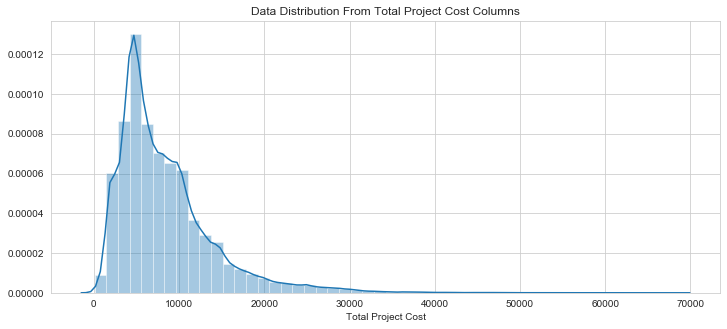

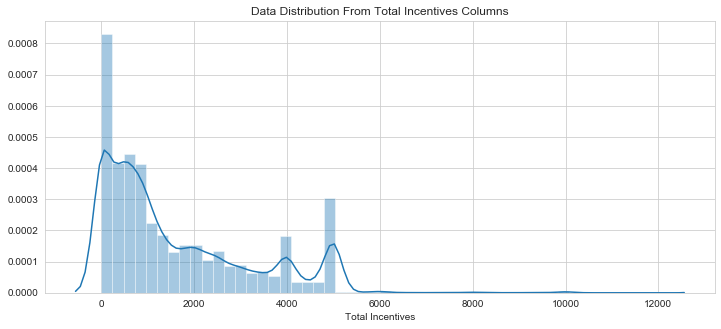

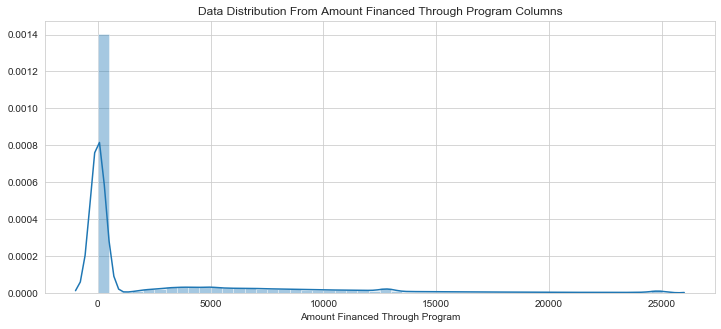

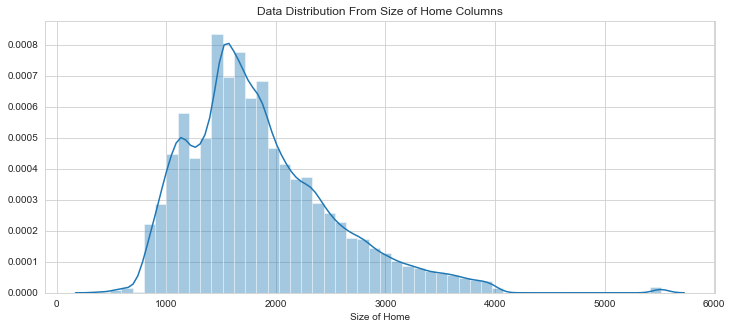

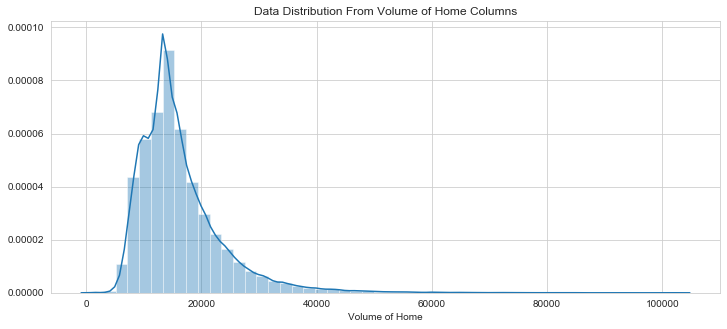

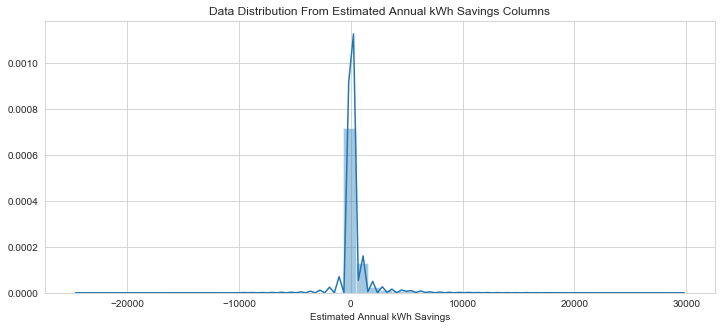

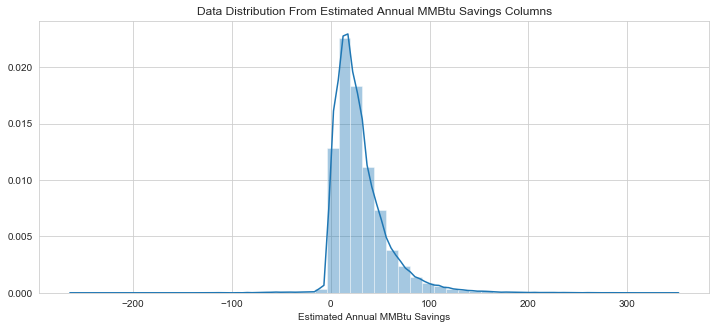

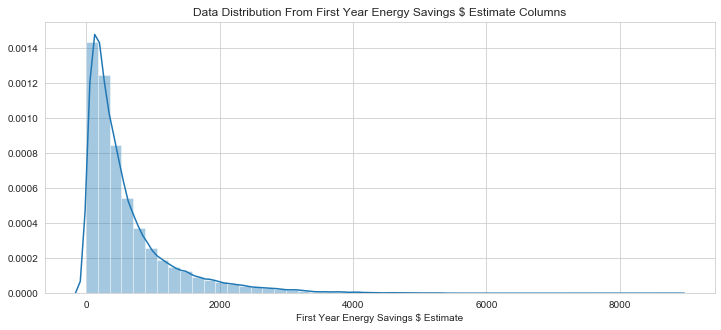

In [8]:
numerical_columns = df.select_dtypes(include='number').columns
sns.set_style('whitegrid')
for item in numerical_columns.drop(['Number of Units']):
    plt.figure(figsize=(12,5))
    plt.title(f'Data Distribution From {item} Columns')
    sns.distplot(df[item])
    plt.show()

> From the graph above shown the distribution of value from each numerical columns. We can conclude from the graph, there are no columns have normal distribution. And there are several projects that Estimated Annual Savings resulted negatives.

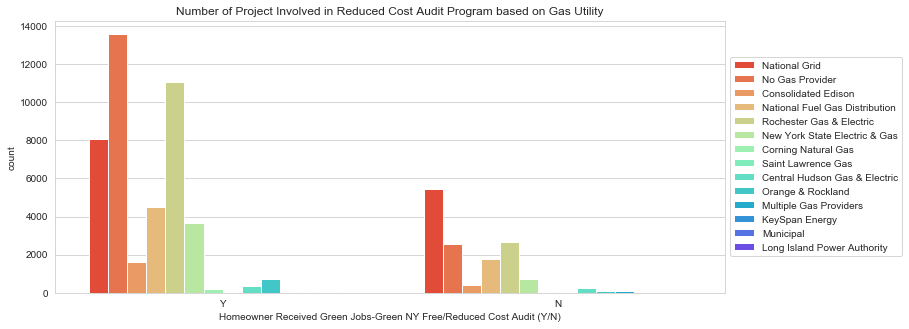

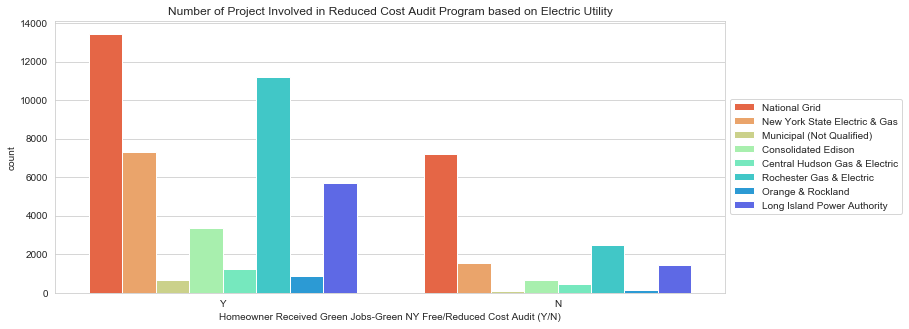

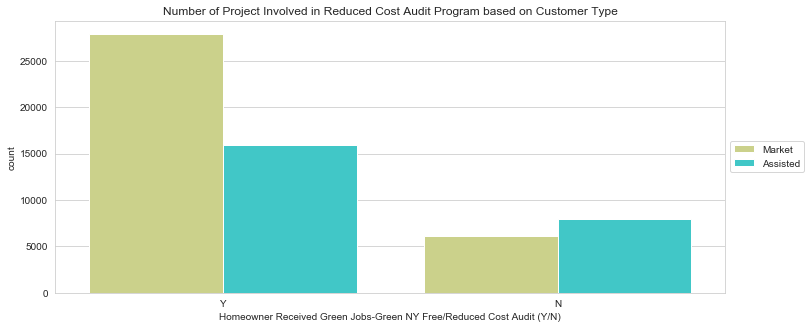

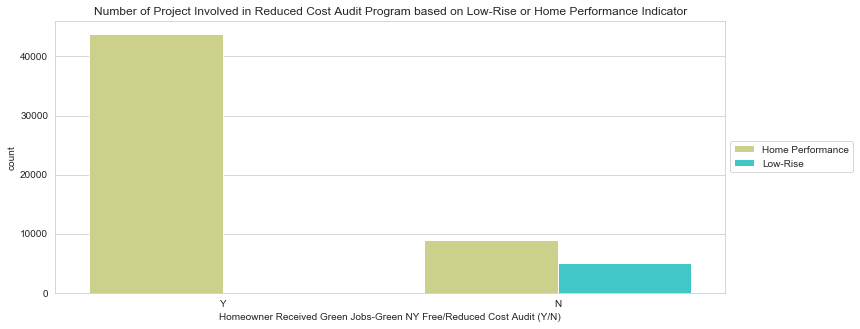

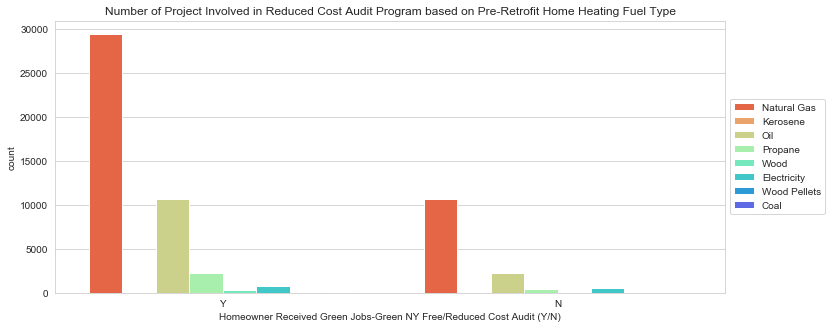

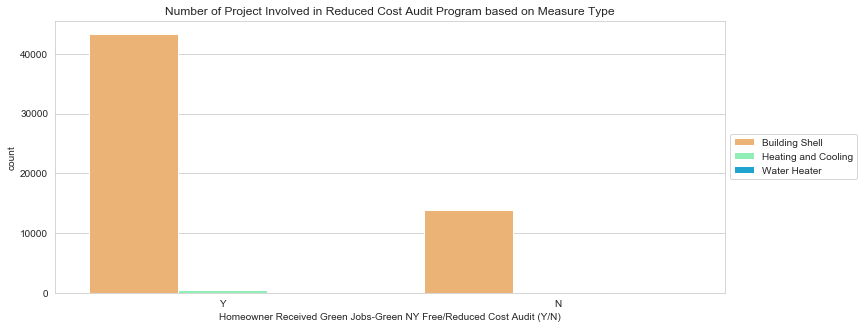

In [9]:
object_columns = df.select_dtypes(include='object').columns
for item in object_columns.drop(['Project County', 'Project City','Homeowner Received Green Jobs-Green NY Free/Reduced Cost Audit (Y/N)']):
    plt.figure(figsize=(12,5))
    plt.title(f'Number of Project Involved in Reduced Cost Audit Program based on {item}')
    sns.countplot(x=df['Homeowner Received Green Jobs-Green NY Free/Reduced Cost Audit (Y/N)'],hue=df[item],palette='rainbow_r').legend(loc='center left',bbox_to_anchor=(1,0.5))
    plt.show()

> The graph above show us about the number of project that either accept or not accept for the program reduced cost audit, based on categorical columns in dataset. From the graph we can conclude, the number of project accepted to program is higher then project rejected 

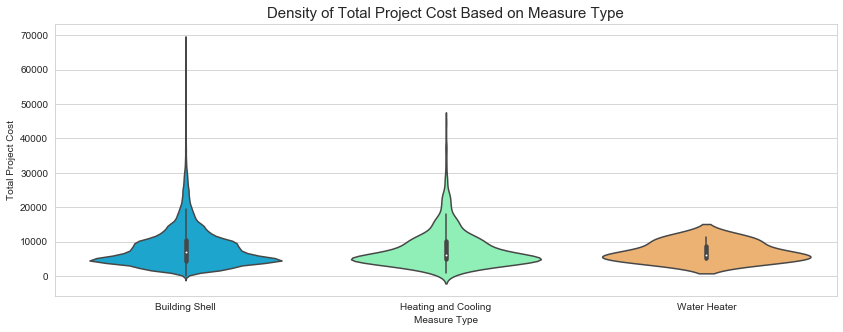

In [10]:
plt.figure(figsize=(14,5))
sns.violinplot(data=df,x='Measure Type',y='Total Project Cost',palette='rainbow')
plt.title('Density of Total Project Cost Based on Measure Type',size=15)
plt.show()

> The plot above tell us about the density of column in Total Project Cost based on Measure Type. As we can see, the highest density value is in between range 0 and 5000

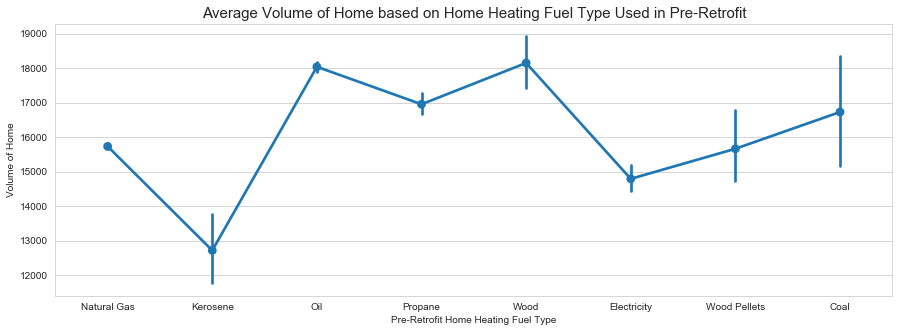

In [11]:
plt.figure(figsize=(15,5))
sns.pointplot(data=df,x='Pre-Retrofit Home Heating Fuel Type',y='Volume of Home')
plt.title('Average Volume of Home based on Home Heating Fuel Type Used in Pre-Retrofit',size=15)
plt.show()

> This pointplot above tell us about average volume of home based on its fuel type use. Looks like heater that use wood is for house that have bigger volume and for the lowest volume of home, they are use kerosene as their fuel heaters.

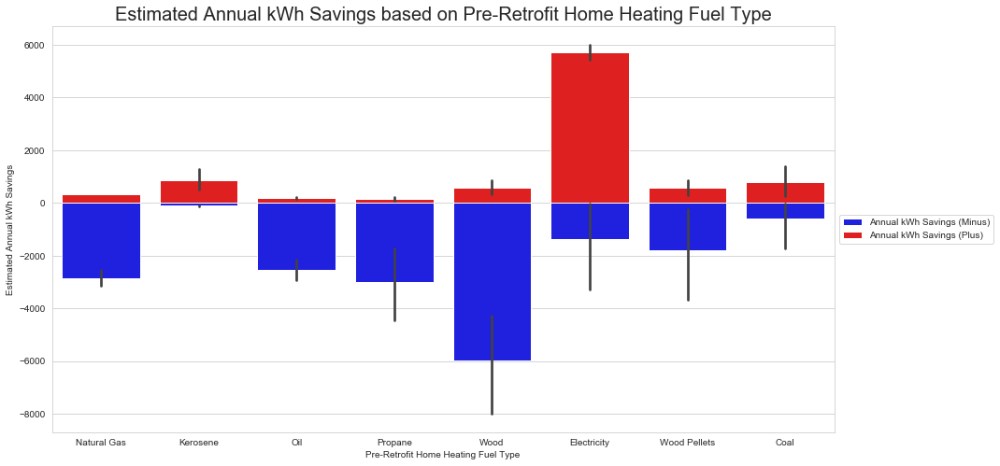

In [12]:
kWh_less_0 = df[df['Estimated Annual kWh Savings']<0]
plt.figure(figsize=(15,8))
sns.barplot(x='Pre-Retrofit Home Heating Fuel Type', y="Estimated Annual kWh Savings", data=kWh_less_0,color='blue',label='Annual kWh Savings (Minus)').legend(loc='center left', bbox_to_anchor=(1, 0.5))
sns.barplot(x='Pre-Retrofit Home Heating Fuel Type', y="Estimated Annual kWh Savings", data=df,color='red',label='Annual kWh Savings (Plus)').legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('Estimated Annual kWh Savings based on Pre-Retrofit Home Heating Fuel Type',size=20)
plt.show()

> From the plot we can see, there are several projects that the number of electricity usage has been increased. In my assumption, it can be occured because maybe some homeowner projects change heating fuel type from non-electricity into electric heating fuel type.

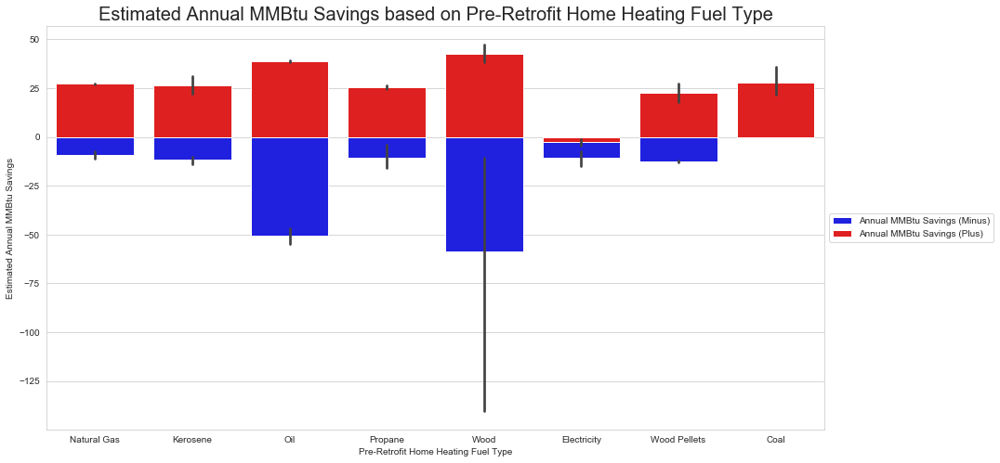

In [13]:
MMBtu_less_0 = df[df['Estimated Annual MMBtu Savings']<0]
plt.figure(figsize=(15,8))
sns.barplot(x='Pre-Retrofit Home Heating Fuel Type', y="Estimated Annual MMBtu Savings", data=MMBtu_less_0,color='blue',label='Annual MMBtu Savings (Minus)').legend(loc='center left', bbox_to_anchor=(1, 0.5))
sns.barplot(x='Pre-Retrofit Home Heating Fuel Type', y="Estimated Annual MMBtu Savings", data=df,color='red',label='Annual MMBtu Savings (Plus)').legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('Estimated Annual MMBtu Savings based on Pre-Retrofit Home Heating Fuel Type',size=20)
plt.show()

> There are some projects that have increasing in the number of saving MMBtu if we look from the type of home heating their used. In my assumptions, it can occur because there are other savings that have impact to increase the needs for heating.

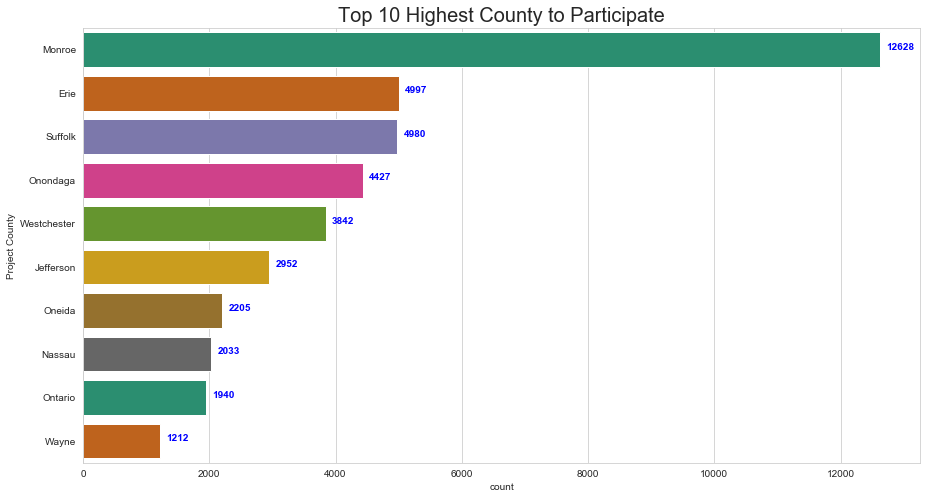

In [14]:
plt.figure(figsize=(15,8))
sns.countplot(y="Project County", data=df,order=df['Project County'].value_counts().iloc[:10].index,palette='Dark2')
for i, v in enumerate(df['Project County'].value_counts().iloc[:10]):
    plt.text(v+100, i, str(v), color='blue', fontweight='bold')
plt.title('Top 10 Highest County to Participate',size=20)
plt.show()

> If we look from places that involved with the projects, Monroe county has the biggest number of involved with the programs and have a big difference of amount with the second biggest number of projects involved in a county

In [15]:
import plotly.graph_objects as go

label_model = df[df['Project County']=='Monroe']['Project City'].value_counts().iloc[:10].index
values_model = df[df['Project County']=='Monroe']['Project City'].value_counts().iloc[:10].values

fig = go.Figure(data = [go.Pie(labels=label_model, values= values_model, hole = .3)])
fig.update(layout_title_text='Top 10 City in Monroe County to Participate with Energy Efficiency Project')
fig.show()

> This pie chart shows about the distribution from city in Monroe County to involved with the programs. It tell us that Rochester City in Monroe County have biggest amount projects that involved in programs

In [16]:
fig = px.scatter(df,x ='Total Project Cost', y='Total Incentives',size='Number of Units',trendline='ols',
                 color='Customer Type',title="Total Project Cost vs Total Incentives",color_continuous_scale='rainbow')
fig.show()

> From the scatter above, we can see amount of incentives that received by Assisted Customer Type is higher than Market incentives. But, it is not totally related with Total Project Cost, some project has high Total Project Cost but did not get any incentives, but there are a lot of projects that have bigger Total Project Cost receive bigger Incentives too, especially from Assited Customer Type.

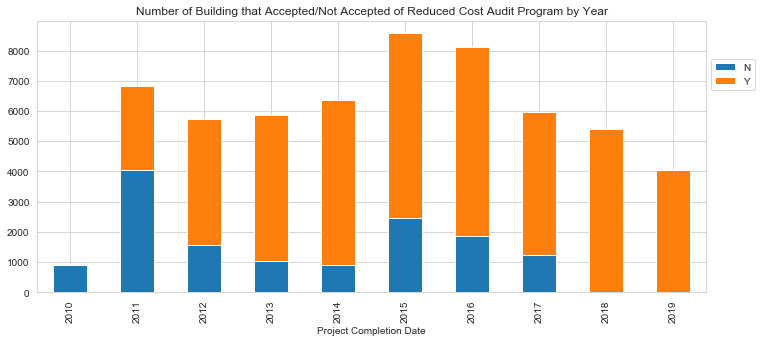

In [17]:
listyear = []
for i in range(len(df)):
    year = df['Project Completion Date'][i].year 
    listyear.append(year)
df['Project Completion Date'] = listyear
df_plot = df.groupby(['Project Completion Date', 'Homeowner Received Green Jobs-Green NY Free/Reduced Cost Audit (Y/N)']).size().reset_index().pivot(columns='Homeowner Received Green Jobs-Green NY Free/Reduced Cost Audit (Y/N)', index='Project Completion Date', values=0)
df_plot.plot(kind='bar', stacked=True,figsize=(12,5),title='Number of Building that Accepted/Not Accepted of Reduced Cost Audit Program by Year').legend(loc='center left',bbox_to_anchor=(1,0.8))
plt.show()

> As we can see from the stacked bar above, in the first year of program there are no project accepted. But starting 2011, there were several projects that succesfull received the program, even until 2014 the accepted number was raising. In 2015 the number of project rejected is increase in line with total of the project that also been increased. But the rejected number slowly decreased until 2019, eventhough the total project also decreased

## Statistics

In [18]:
import pingouin as pg
import statsmodels.api as sm
import pylab
from scipy.stats import anderson, mannwhitneyu

## Hypothesis Testing
- Assumption Significant Level : 5%

### Normality Tests

Assumptions:

- Observations in each sample are independent and identically distributed (iid).

Interpretation

- H0: the sample has a Gaussian distribution.
- H1: the sample does not have a Gaussian distribution.


In [19]:
def normality_test(data):
    dfNorm = pd.DataFrame({
        'Statistic' : anderson(data)[0],
        'Critical Value' : anderson(data)[1],
        'Significance Level (%)' : anderson(data)[2]
    })
    listmsg= []
    for i in range(len(dfNorm['Statistic'])):
        if dfNorm['Statistic'].values[i] > dfNorm['Critical Value'].values[i]:
            msg =('Reject H0, Sample Not Has Normal Distribution')
        else:
            msg =('Fail to Reject H0, Sample Has Normal Distribution')
        listmsg.append(msg)
    dfNorm['Conclusion'] = listmsg
    
    fig,ax = plt.subplots(ncols=2,nrows=1,figsize=(10,4))
    sns.distplot(data,color = 'red',ax=ax[0])
    ax[0].set_xlabel("Frequency")
    ax[0].set_title('Distribution Plot')
    
    pg.qqplot(data, dist='norm', ax=ax[1])
    plt.title('QQ Plot Testing')
    pylab.show()
    
    plt.tight_layout
    
    return dfNorm

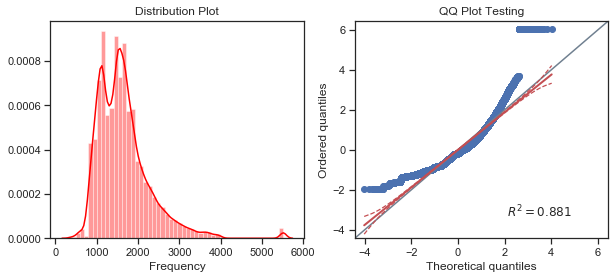

,Statistic,Critical Value,Significance Level (%),Conclusion
0,508.718041,0.576,15.0,"Reject H0, Sample Not Has Normal Distribution"
1,508.718041,0.656,10.0,"Reject H0, Sample Not Has Normal Distribution"
2,508.718041,0.787,5.0,"Reject H0, Sample Not Has Normal Distribution"
3,508.718041,0.918,2.5,"Reject H0, Sample Not Has Normal Distribution"
4,508.718041,1.092,1.0,"Reject H0, Sample Not Has Normal Distribution"


In [20]:
normality_test(df[df['Customer Type'] == 'Assisted']['Size of Home'])

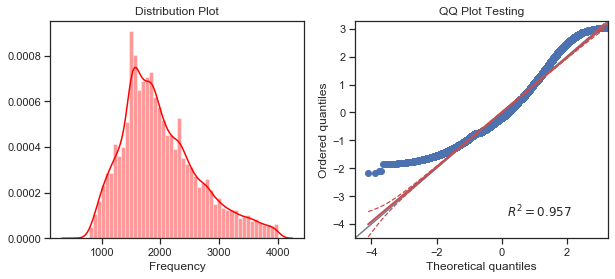

,Statistic,Critical Value,Significance Level (%),Conclusion
0,416.375456,0.576,15.0,"Reject H0, Sample Not Has Normal Distribution"
1,416.375456,0.656,10.0,"Reject H0, Sample Not Has Normal Distribution"
2,416.375456,0.787,5.0,"Reject H0, Sample Not Has Normal Distribution"
3,416.375456,0.918,2.5,"Reject H0, Sample Not Has Normal Distribution"
4,416.375456,1.092,1.0,"Reject H0, Sample Not Has Normal Distribution"


In [21]:
normality_test(df[df['Customer Type'] == 'Market']['Size of Home'])

> We can take conclusion from the normality test that those data is not Normal Distribution. So we can use Mannwhitneyu Testing because data are non-parametric and only have two data groups

### Mannwhitneyu Testing

Tests whether the distributions of two independent samples are equal or not.

Assumptions

- Data is non-parametric
- Observations in each sample are independent and identically distributed (iid).


Interpretation

- H0: the distributions of both samples are equal.
- H1: the distributions of both samples are not equal.


In [22]:
result = mannwhitneyu(df[df['Customer Type'] == 'Assisted']['Size of Home'],
                      df[df['Customer Type'] == 'Market']['Size of Home'])
print('U-Statistics : ',result[0])
print('P-Value : ', result[1])

U-Statistics :  265669467.0
P-Value :  0.0


> P- Value is less than Significance Level (0.05), that shows that we reject the null hyphotesis there are differences between the distributions for both data

## Chi-Squared Test

Tests whether two variables are related or independent.

Assumptions

- Observations used in the calculation of the contingency table are independent.

Interpretation

- H0: the two samples are independent.
- H1: there is a dependency between the samples.


In [23]:
from scipy.stats import chi2_contingency
chi2_check = []
for i in df.drop('Homeowner Received Green Jobs-Green NY Free/Reduced Cost Audit (Y/N)',axis=1).columns:
    if chi2_contingency(pd.crosstab(df['Homeowner Received Green Jobs-Green NY Free/Reduced Cost Audit (Y/N)'],df[i]))[1] < 0.05:
        chi2_check.append('Reject Null Hypothesis')
    else:
        chi2_check.append('Fail to Reject Null Hypothesis')
result = pd.DataFrame(data=[df.drop('Homeowner Received Green Jobs-Green NY Free/Reduced Cost Audit (Y/N)',axis=1).columns,chi2_check]).T
result.columns = ['Data Column', 'Result Hypothesis']
result

,Data Column,Result Hypothesis
0,Project County,Reject Null Hypothesis
1,Project City,Reject Null Hypothesis
2,Gas Utility,Reject Null Hypothesis
3,Electric Utility,Reject Null Hypothesis
4,Project Completion Date,Reject Null Hypothesis
5,Customer Type,Reject Null Hypothesis
6,Low-Rise or Home Performance Indicator,Reject Null Hypothesis
7,Total Project Cost,Reject Null Hypothesis
8,Total Incentives,Reject Null Hypothesis
9,Amount Financed Through Program,Fail to Reject Null Hypothesis


> My analysis to compare Homeowner Received Green Jobs-Green NY Free/Reduced Cost Audit (Y/N) and others columns, there is only Fail to reject Null Hypothesis in Amount Financed Through Program. It means between those columns are the only column that have independent samples.